In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

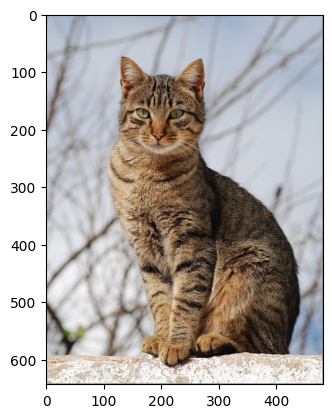

In [5]:
img = cv2.imread('cat.png')
img = img[:,:,::-1]
plt.imshow(img)

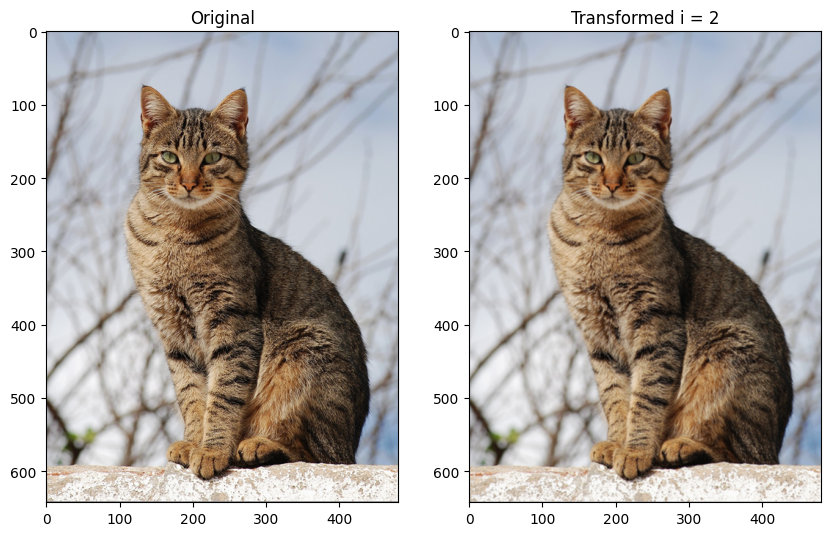

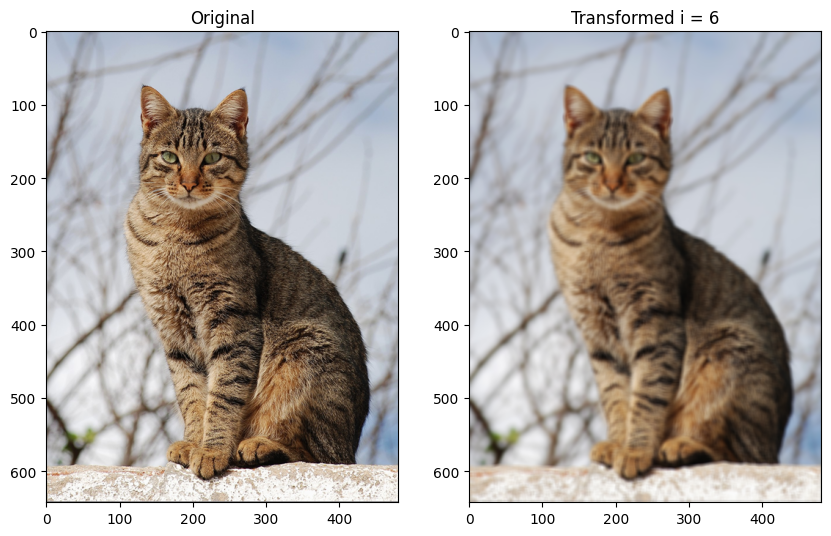

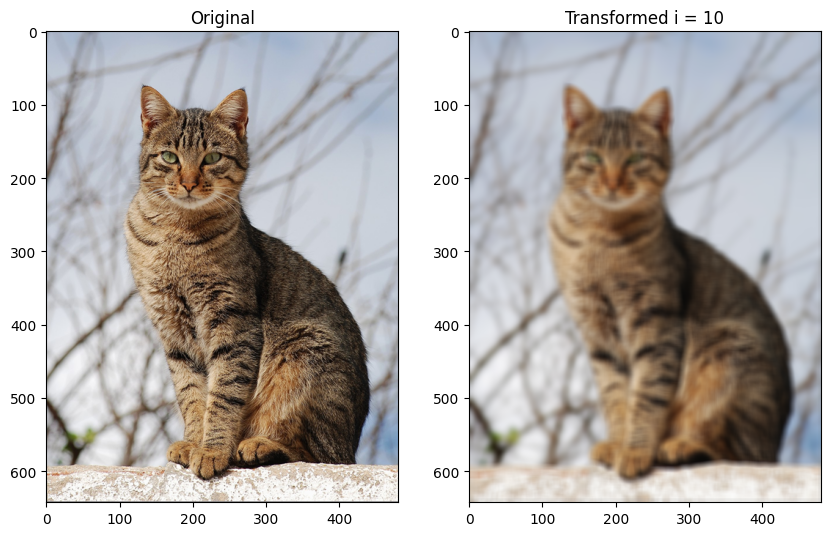

In [6]:
# 1. Sử dụng boxFilter: cv2.blur() hoặc cv2.boxFilter() để làm mờ ảnh (sử dụng nhiều thông số filter khác nhau), biểu diễn ảnh gốc và ảnh làm mờ cùng nhau để kiểm chứng
def show_pair(orig, trans, i):
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1); plt.imshow(orig); plt.title('Original')
    plt.subplot(1,2,2); plt.imshow(trans); plt.title('Transformed i = ' + str(i))
    plt.show()

for i in range(2,11,4):
    blur = cv2.blur(img, (i,i))
    show_pair(img, blur, i)

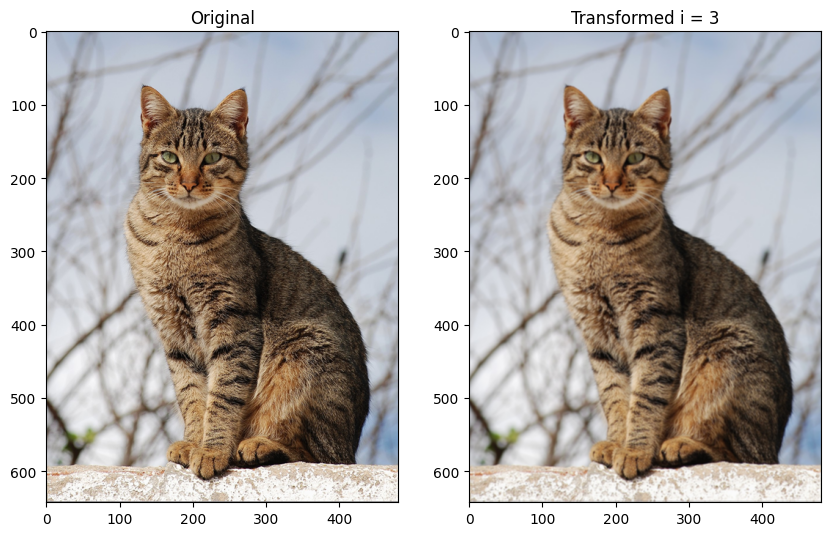

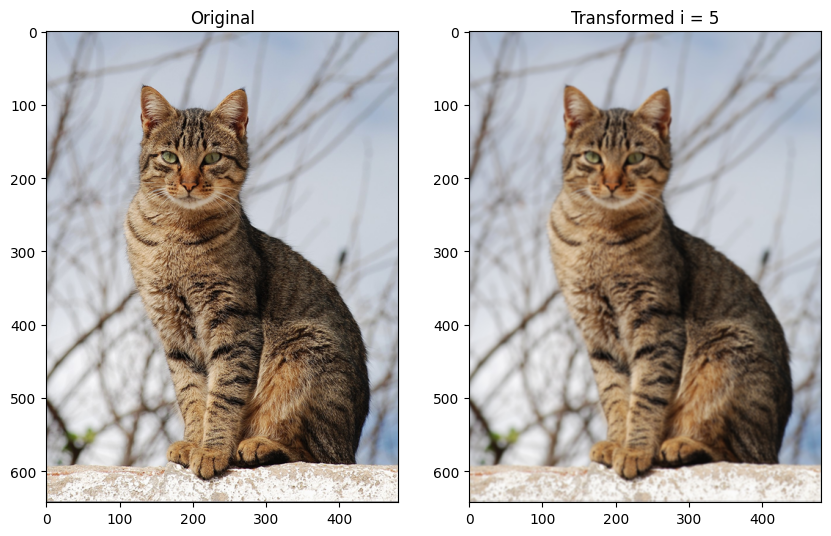

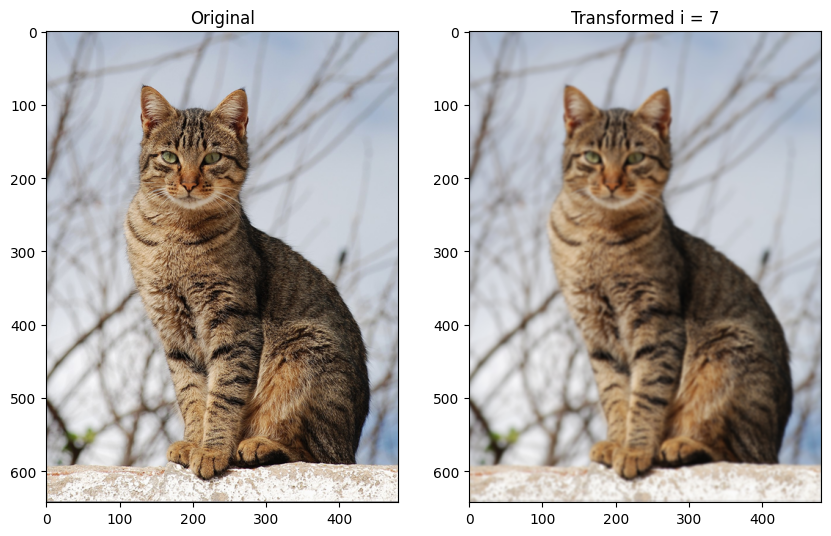

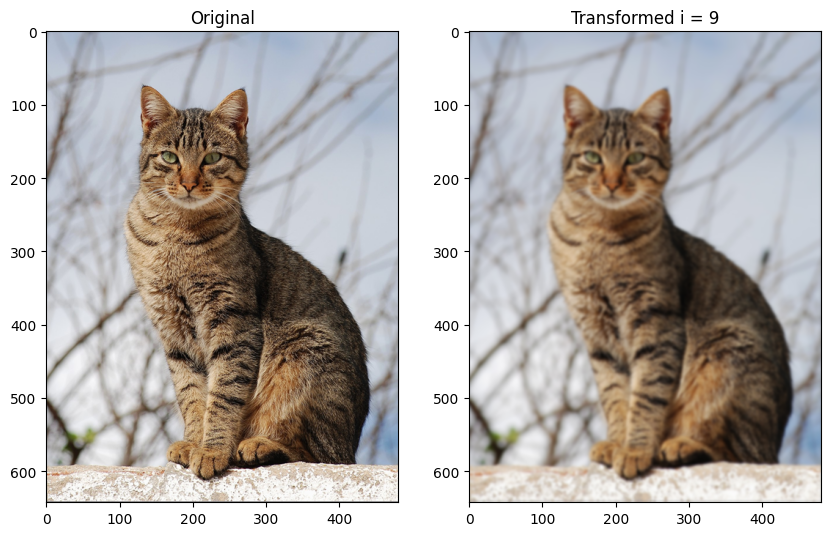

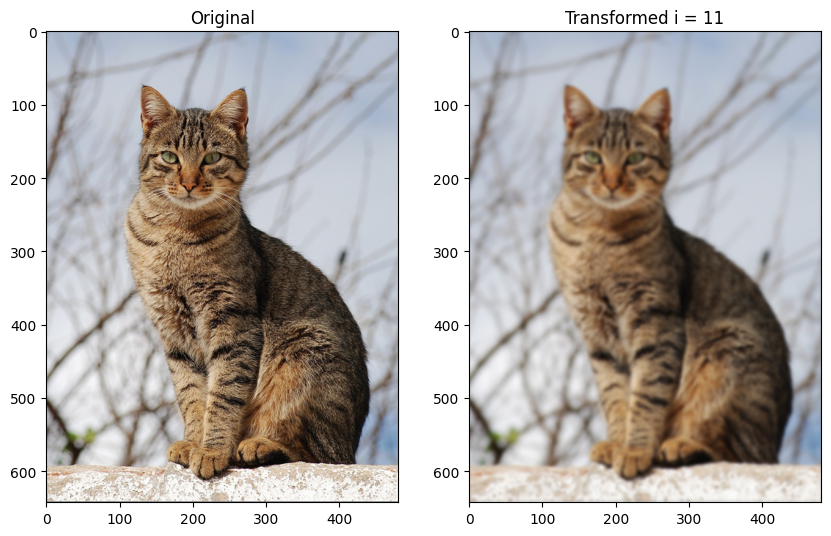

In [7]:
# 2. Sử dụng Gaussian Filter # Lưu ý: kích thước bộ lọc là số lẻ.
for i in range(3, 12, 2):
    sigma = 0
    blur = cv2.GaussianBlur(img, (i, i), sigma)
    show_pair(img, blur, i)

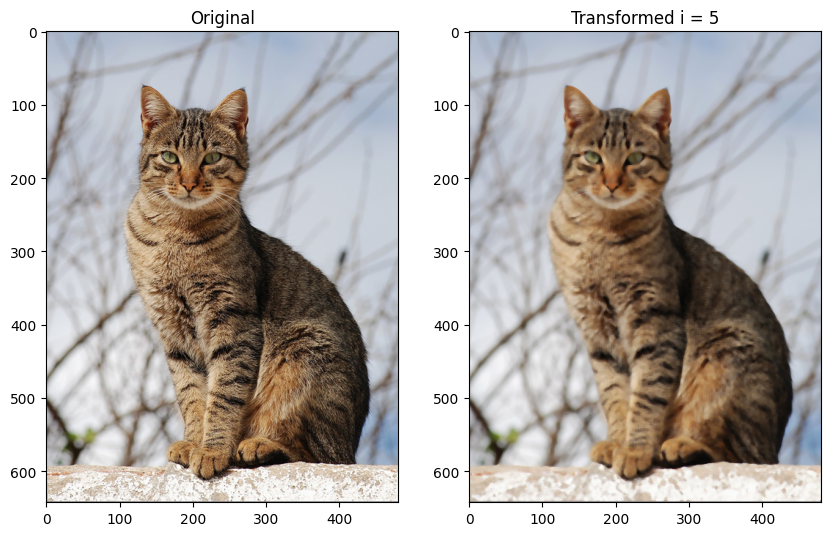

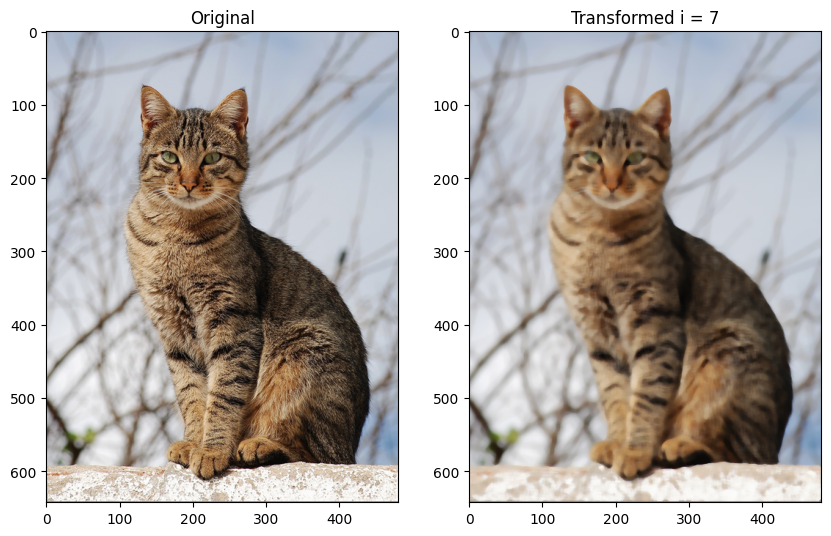

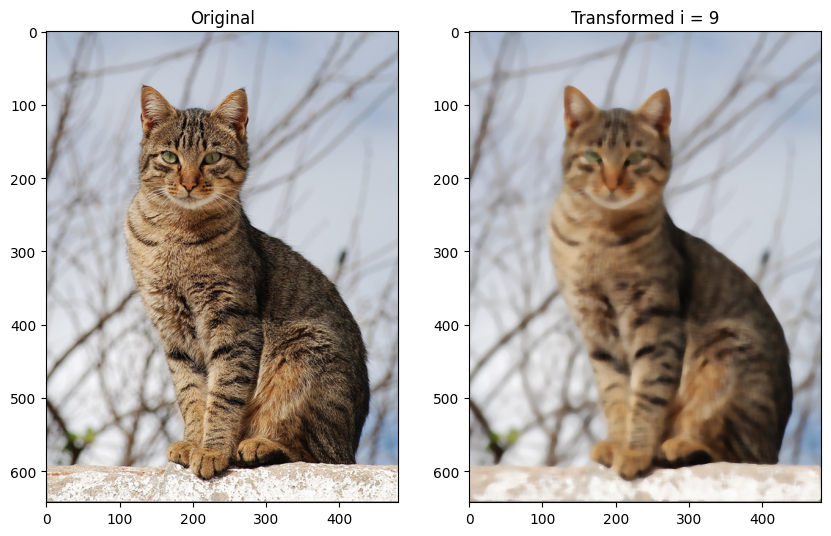

In [8]:
# 3. Sử dụng Median Filter 
for i in range(5,10,2):
    median_filter = cv2.medianBlur(img, i)
    show_pair(img, median_filter, i)

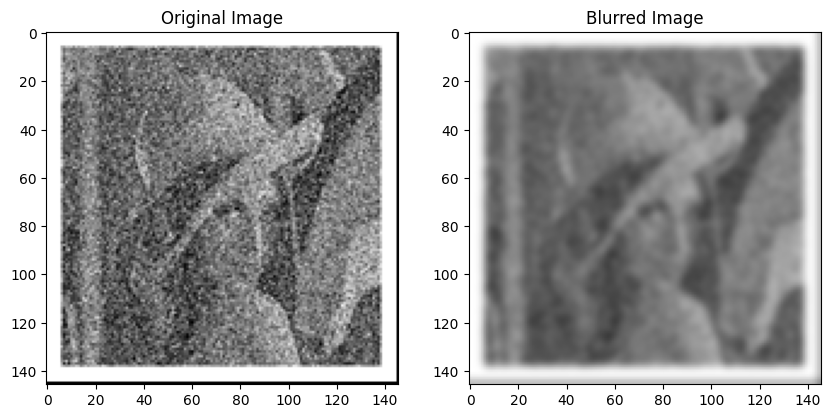

In [9]:
pp1 = cv2.imread('peper_noise01.png')
k_size = 9
blurred_image = cv2.GaussianBlur(pp1, (k_size, k_size), 0)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(pp1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(blurred_image)
plt.title('Blurred Image')
plt.show()

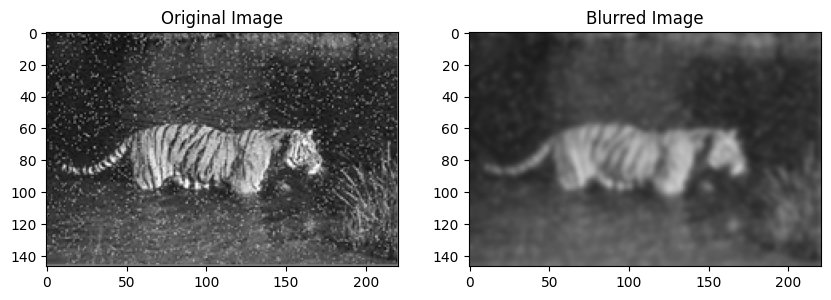

In [10]:
pp2 = cv2.imread('peper_noise02.png')
k_size = 9
blurred_image = cv2.GaussianBlur(pp2, (k_size, k_size), 0)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(pp2)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(blurred_image)
plt.title('Blurred Image')
plt.show()

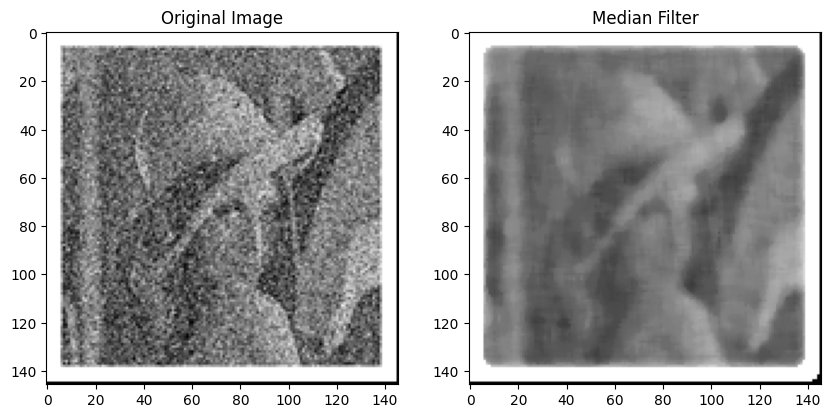

In [11]:
median_filter = cv2.medianBlur(pp1, 7)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(pp1, cmap='gray')
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(median_filter, cmap='gray')
plt.title('Median Filter')
plt.show()

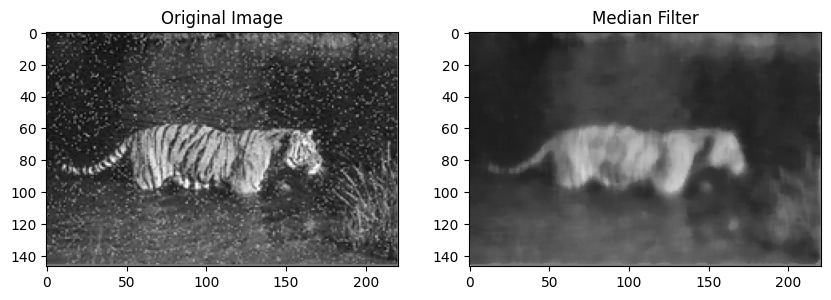

In [12]:
median_filter = cv2.medianBlur(pp2, 7)
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(pp2, cmap='gray')
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(median_filter, cmap='gray')
plt.title('Median Filter')
plt.show()

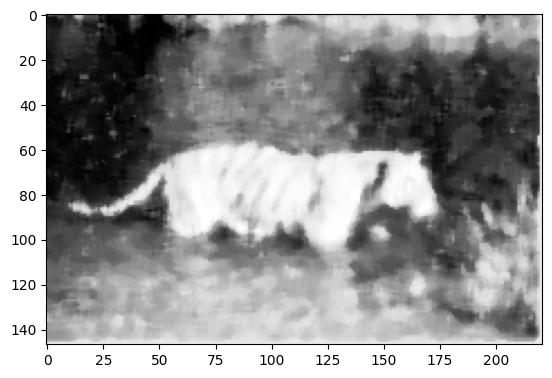

In [13]:
# 6. Thực hành với Cân bằng sáng - equalizeHist, để cân bằng sáng, trước hết ta chuyển ảnh trắng đen (nếu có) sang ảnh màu. 
img2 = cv2.imread('peper_noise02.png')
blur = cv2.medianBlur(img2,5)
blur = cv2.cvtColor(blur, cv2.COLOR_RGB2GRAY)
equalized_image = cv2.equalizeHist(blur)
equalized_color_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2BGR)

plt.imshow(equalized_color_image,cmap='gray')
plt.show()

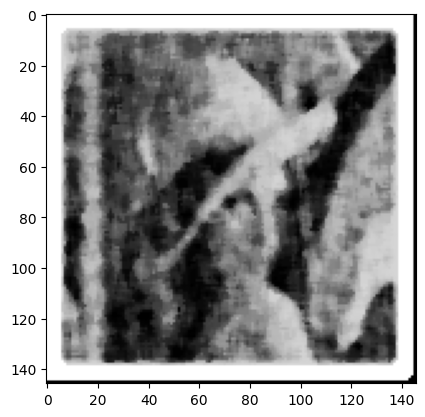

In [14]:
img1 = cv2.imread('peper_noise01.png')
blur = cv2.medianBlur(img1,5)
blur = cv2.cvtColor(blur, cv2.COLOR_RGB2GRAY)
equalized_image = cv2.equalizeHist(blur)
equalized_color_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2BGR)

plt.imshow(equalized_color_image,cmap='gray')
plt.show()

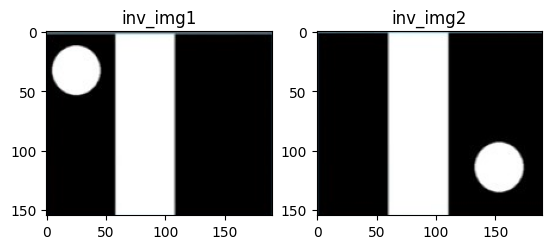

In [15]:
img1 = cv2.imread('exT3_01.png')
img2 = cv2.imread('exT3_02.png')
img1 = img1[:155,1:191]
img2 = img2[:155,:190]
inv_img1 = cv2.bitwise_not(img1)
inv_img2 = cv2.bitwise_not(img2)

plt.subplot(121)
plt.imshow(inv_img1,cmap='gray')
plt.title('inv_img1')
plt.subplot(122)
plt.imshow(inv_img2,cmap='gray')
plt.title('inv_img2')
plt.show()

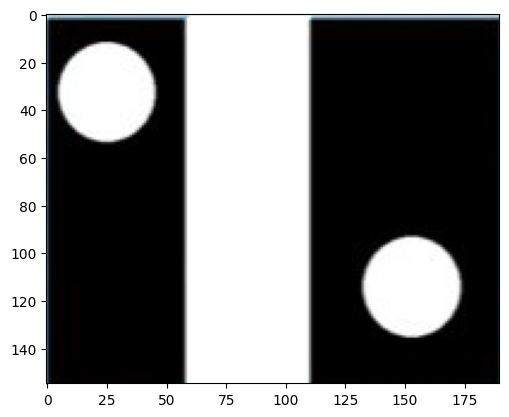

In [16]:
img3 = cv2.add(inv_img1, inv_img2)

plt.imshow(img3)
plt.show()

Removed artifact at x=0 with Aspect Ratio=1.23


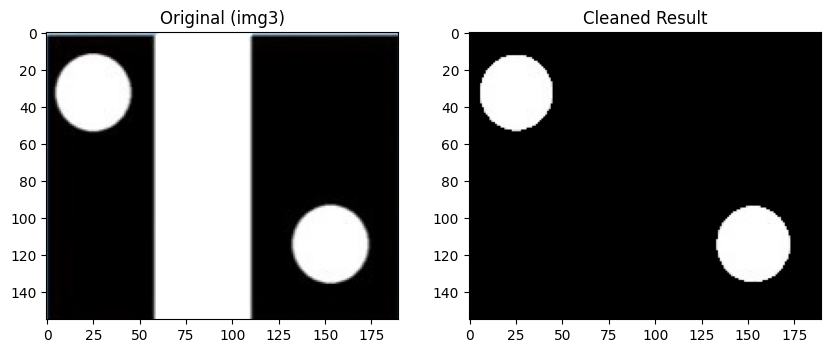

In [17]:
# 1. Chuyển sang ảnh xám (Grayscale) để xử lý
gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

# 2. Phân ngưỡng (Threshold) để tạo ảnh nhị phân
_, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# 3. Tìm các đường viền (Contours)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 4. Tạo mặt nạ đen (Mask)
mask = np.zeros_like(gray)

for cnt in contours:
    # Lấy hình chữ nhật bao quanh đối tượng
    x, y, w, h = cv2.boundingRect(cnt)
    
    # Tính tỷ lệ khung hình (Aspect Ratio): $AR = \frac{w}{h}$
    aspect_ratio = float(w) / h
    
    # Logic lọc: Hình tròn sẽ có AR xấp xỉ 1.0 (ví dụ: 0.8 - 1.2).
    # Hình chữ nhật đứng ở giữa ảnh của bạn có h lớn, w nhỏ => AR << 1.
    if 0.8 < aspect_ratio < 1.2:
        # Vẽ lại hình tròn vào mask (màu trắng)
        cv2.drawContours(mask, [cnt], -1, 255, -1)
    else:
        print(f"Removed artifact at x={x} with Aspect Ratio={aspect_ratio:.2f}")

# 5. Áp dụng mask vào ảnh gốc để lấy kết quả cuối cùng
clean_img = cv2.bitwise_and(img3, img3, mask=mask)

# Hiển thị kết quả
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original (img3)")
plt.imshow(img3)
plt.subplot(1, 2, 2)
plt.title("Cleaned Result")
plt.imshow(clean_img)
plt.show()

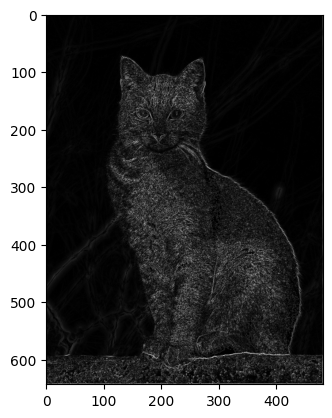

In [18]:
img = cv2.imread("cat.png", cv2.IMREAD_GRAYSCALE).astype(np.float32)

# Kernel forward
kernel_fx = np.array([[ -1, 1 ]], dtype=np.float32)
kernel_fy = np.array([[ -1 ],
                      [  1 ]], dtype=np.float32)

grad_fx = cv2.filter2D(img, -1, kernel_fx)
grad_fy = cv2.filter2D(img, -1, kernel_fy)

grad_forward = cv2.magnitude(grad_fx, grad_fy)

plt.imshow(grad_forward, cmap="gray")
plt.show()

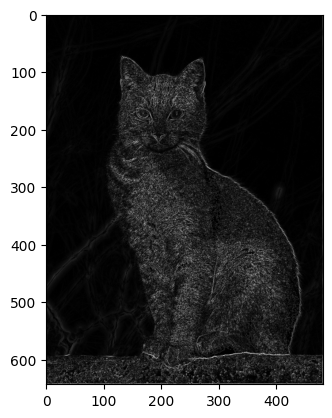

In [19]:
# Kernel backward
kernel_bx = np.array([[ 1, -1 ]], dtype=np.float32)
kernel_by = np.array([[ 1 ],
                      [ -1 ]], dtype=np.float32)

grad_bx = cv2.filter2D(img, -1, kernel_bx)
grad_by = cv2.filter2D(img, -1, kernel_by)

grad_backward = cv2.magnitude(grad_bx, grad_by)

plt.imshow(grad_backward, cmap='gray')
plt.show()

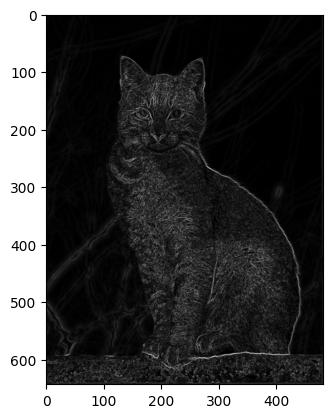

In [20]:
# Kernel central
kernel_cx = np.array([[ -0.5, 0, 0.5 ]], dtype=np.float32)
kernel_cy = np.array([[ -0.5 ],
                      [  0   ],
                      [  0.5 ]], dtype=np.float32)

grad_cx = cv2.filter2D(img, -1, kernel_cx)
grad_cy = cv2.filter2D(img, -1, kernel_cy)

grad_central = cv2.magnitude(grad_cx, grad_cy)

plt.imshow(grad_central, cmap='gray')
plt.show()

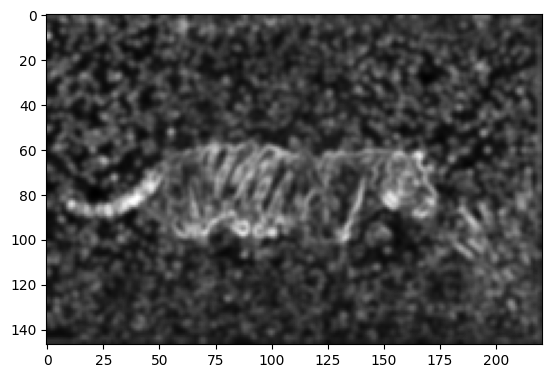

In [21]:
noisy_img = cv2.imread("peper_noise02.png", cv2.IMREAD_GRAYSCALE).astype(np.float32)

kernel_dx = np.array([[-1, 0, 1]], dtype=np.float32) / 2
kernel_dy = np.array([[-1],
                      [ 0],
                      [ 1]], dtype=np.float32) / 2

dx = cv2.filter2D(noisy_img, -1, kernel_dx)
dy = cv2.filter2D(noisy_img, -1, kernel_dy)

gradient = cv2.magnitude(dx, dy)

gradient_smooth = cv2.GaussianBlur(gradient, (5, 5), 1.0)

plt.imshow(gradient_smooth, cmap="gray")
plt.show()

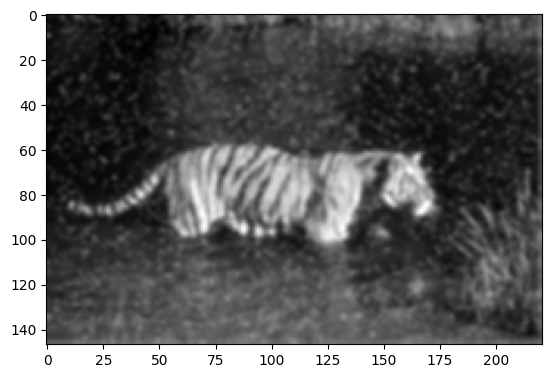

In [22]:
gaussian_filtered = cv2.GaussianBlur(
    noisy_img,
    ksize=(5, 5),
    sigmaX=1.0,
    sigmaY=1.0
)

plt.imshow(gaussian_filtered, cmap='gray')
plt.show()

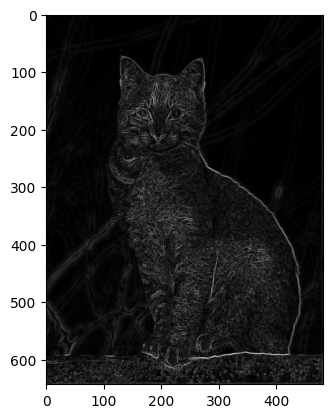

In [23]:
sobel_x = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)

sobel_mag = cv2.magnitude(sobel_x, sobel_y)

sobel_display = sobel_mag / sobel_mag.max()

plt.imshow(sobel_display, cmap='gray')
plt.show()

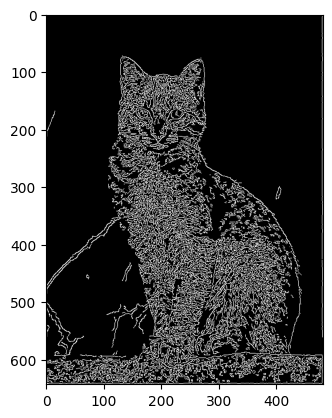

In [24]:
img = cv2.imread('cat.png', cv2.IMREAD_GRAYSCALE)
edges = cv2.Canny(
    img,
    threshold1=100,   # ngưỡng thấp
    threshold2=200    # ngưỡng cao
)

plt.imshow(edges, cmap='gray')
plt.show()

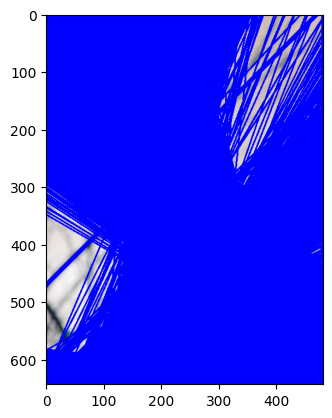

In [29]:
# Hough Transform chuẩn
lines = cv2.HoughLines(edges, 1, np.pi/180, 150)

# Vẽ các đường thẳng
if lines is not None:
    for i in range(len(lines)):
        rho, theta = lines[i][0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.imshow(img, cmap="gray")
plt.show()
